In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_curve, precision_score, recall_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import CategoricalNB, BernoulliNB, MultinomialNB, GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize
import datetime
from typing import Tuple

import plotly.graph_objects as go
from nltk.corpus import stopwords

In [2]:
# df = pd.read_csv('export_data.csv')
df = pd.read_csv('House_Rent_Dataset.csv')
df.head()

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact
0,5/18/2022,2,10000,1100,Ground out of 2,Super Area,Bandel,Kolkata,Unfurnished,Bachelors/Family,2,Contact Owner
1,5/13/2022,2,20000,800,1 out of 3,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
2,5/16/2022,2,17000,1000,1 out of 3,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
3,7/4/2022,2,10000,800,1 out of 2,Super Area,Dumdum Park,Kolkata,Unfurnished,Bachelors/Family,1,Contact Owner
4,5/9/2022,2,7500,850,1 out of 2,Carpet Area,South Dum Dum,Kolkata,Unfurnished,Bachelors,1,Contact Owner


# 4.1 Tiền xử lý dữ liệu 

In [3]:
pd.set_option('display.max_rows', None)
pd.DataFrame(df.groupby('Floor')['Floor'].count())
pd.set_option('display.max_rows', 50)

## 4.1.1. Bổ sung các thuộc tính is_basement, floor_number, building_floors được phân tách từ cột Floor

In [4]:
def feature_floor_split(r: pd.core.series.Series) -> Tuple[int, int]:
    if ' out of ' in r['Floor']:
        floor, max_floors = r['Floor'].split(' out of ')
        return [
            -1 if 'Basement' in floor else int(floor)
            , int(max_floors)
        ]
    # This accounts for the values where instead of having a floor like "1 out of 3", it just has "1".
    return [int(r['Floor'].split(' out of ')[0]), None]

def feature_is_basement(r: pd.core.series.Series) -> str:
    if 'Basement' in r['Floor']:
        return 1
    return 0

# Replace all instances of "Ground" with 0
df['Floor'] = df['Floor'].str.replace('Ground', '0')

# Create `is_basement` + floor cols
df['is_basement'] = df.apply(lambda row: feature_is_basement(row), axis=1)
df['floor_number'] = df.apply(lambda row: feature_floor_split(row)[0], axis=1)
df['building_floors'] = df.apply(lambda row: feature_floor_split(row)[1], axis=1)

df.head()

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact,is_basement,floor_number,building_floors
0,5/18/2022,2,10000,1100,0 out of 2,Super Area,Bandel,Kolkata,Unfurnished,Bachelors/Family,2,Contact Owner,0,0,2.0
1,5/13/2022,2,20000,800,1 out of 3,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner,0,1,3.0
2,5/16/2022,2,17000,1000,1 out of 3,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner,0,1,3.0
3,7/4/2022,2,10000,800,1 out of 2,Super Area,Dumdum Park,Kolkata,Unfurnished,Bachelors/Family,1,Contact Owner,0,1,2.0
4,5/9/2022,2,7500,850,1 out of 2,Carpet Area,South Dum Dum,Kolkata,Unfurnished,Bachelors,1,Contact Owner,0,1,2.0


## 4.1.2. Xóa các thuộc tính không cần thiết

In [5]:
for col in ['Tenant Preferred', 'Floor']:
    df.drop(col, inplace=True, axis=1)

df.head()

,Posted On,BHK,Rent,Size,Area Type,Area Locality,City,Furnishing Status,Bathroom,Point of Contact,is_basement,floor_number,building_floors
0,5/18/2022,2,10000,1100,Super Area,Bandel,Kolkata,Unfurnished,2,Contact Owner,0,0,2.0
1,5/13/2022,2,20000,800,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,1,Contact Owner,0,1,3.0
2,5/16/2022,2,17000,1000,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,1,Contact Owner,0,1,3.0
3,7/4/2022,2,10000,800,Super Area,Dumdum Park,Kolkata,Unfurnished,1,Contact Owner,0,1,2.0
4,5/9/2022,2,7500,850,Carpet Area,South Dum Dum,Kolkata,Unfurnished,1,Contact Owner,0,1,2.0


## 4.1.3. Lưu dataset đẵ được xử lý

In [6]:
df.to_excel(r'D:\Full_final_dataset.xlsx', index=False)

In [6]:
df

,Posted On,BHK,Rent,Size,Area Type,Area Locality,City,Furnishing Status,Bathroom,Point of Contact,is_basement,floor_number,building_floors
0,5/18/2022,2,10000,1100,Super Area,Bandel,Kolkata,Unfurnished,2,Contact Owner,0,0,2.0
1,5/13/2022,2,20000,800,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,1,Contact Owner,0,1,3.0
2,5/16/2022,2,17000,1000,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,1,Contact Owner,0,1,3.0
3,7/4/2022,2,10000,800,Super Area,Dumdum Park,Kolkata,Unfurnished,1,Contact Owner,0,1,2.0
4,5/9/2022,2,7500,850,Carpet Area,South Dum Dum,Kolkata,Unfurnished,1,Contact Owner,0,1,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4741,5/18/2022,2,15000,1000,Carpet Area,Bandam Kommu,Hyderabad,Semi-Furnished,2,Contact Owner,0,3,5.0
4742,5/15/2022,3,29000,2000,Super Area,"Manikonda, Hyderabad",Hyderabad,Semi-Furnished,3,Contact Owner,0,1,4.0
4743,7/10/2022,3,35000,1750,Carpet Area,"Himayath Nagar, NH 7",Hyderabad,Semi-Furnished,3,Contact Agent,0,3,5.0
4744,7/6/2022,3,45000,1500,Carpet Area,Gachibowli,Hyderabad,Semi-Furnished,2,Contact Agent,0,23,34.0


# 4.2. Phân tích dữ liệu 

## 4.2.1. Thống kê mô tả

Nhận thấy rằng dataset có giá trị các cột bao gồm hai loại dữ liệu số là 
Int và Float. Ta tiến hành lọc ra các cột có kiểu dữ liệu là Int hoặc Float để tính 
toán.

In [7]:
numeric_cols = df.select_dtypes(include=['int', 'float']).columns

Sử dụng phương thức describe() để tính toán thống kê mô tả cơ bản về
số lượng, trung bình, độ lệch chuẩn, giá trị tối thiểu, giá trị tối đa và các phân vị
(quantiles) cho tất cả các cột có kiểu dữ liệu là Int hoặc Float

In [8]:
stats = df[numeric_cols].describe().T

 Tính toán thêm các giá trị mode, range, and variance cho tất cả các cột 
có kiểu dữ liệu là Int hoặc Float

In [9]:

for col in df[numeric_cols].columns:
    stats.loc[col, 'mode'] = df[col].mode()[0]
for col in df[numeric_cols].columns:
    stats.loc[col, 'range'] = df[col].max() - df[col].min()
for col in df[numeric_cols].columns:
    stats.loc[col, 'variance'] = df[col].var()
display(stats)

,count,mean,std,min,25%,50%,75%,max,mode,range,variance
BHK,4746.0,2.083860,0.832256,1.0,2.0,2.0,3.0,6.0,2.0,5.0,6.926499e-01
Rent,4746.0,34993.451327,78106.412937,1200.0,10000.0,16000.0,33000.0,3500000.0,15000.0,3498800.0,6.100612e+09
Size,4746.0,967.490729,634.202328,10.0,550.0,850.0,1200.0,8000.0,1000.0,7990.0,4.022126e+05
Bathroom,4746.0,1.965866,0.884532,1.0,1.0,2.0,2.0,10.0,2.0,9.0,7.823963e-01
is_basement,4746.0,0.007164,0.084345,0.0,0.0,0.0,0.0,1.0,0.0,1.0,7.114105e-03
floor_number,4746.0,3.438475,5.771967,-1.0,1.0,2.0,3.0,76.0,1.0,77.0,3.331560e+01
building_floors,4742.0,6.973429,9.469727,1.0,2.0,4.0,6.0,89.0,4.0,88.0,8.967573e+01


## 4.2.2. Trực quan hóa dữ liệu

### Trực quan hóa giá nhà trung bình ở mỗi thành phố 

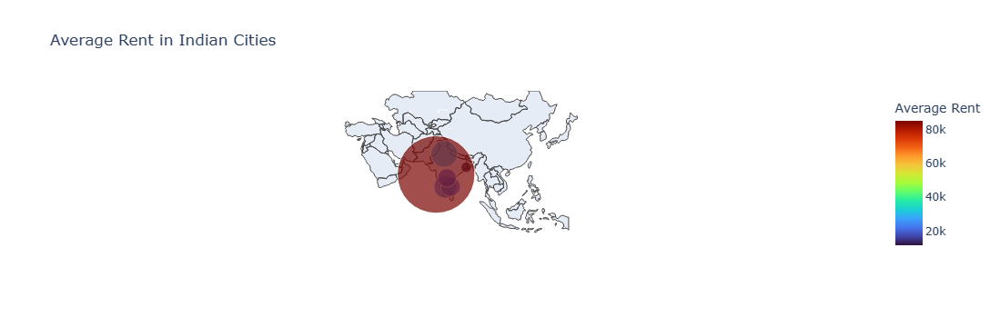

In [10]:
import numpy as np
import plotly.graph_objects as go

# Tính toán giá thuê trung bình cho mỗi thành phố
city_rent_avg = df.groupby("City")["Rent"].mean().reset_index()

# Định nghĩa tọa độ địa lý cho mỗi thành phố
city_coords = {
    "Mumbai": {"lat": 19.0760, "lon": 72.8777},
    "Hyderabad": {"lat": 17.3850, "lon": 78.4867},
    "Delhi": {"lat": 28.7041, "lon": 77.1025},
    "Chennai": {"lat": 13.0827, "lon": 80.2707},
    "Bangalore": {"lat": 12.9716, "lon": 77.5946},
     "Kolkata": {"lat": 22.5726, "lon": 88.3639}
}

# Thêm tọa độ vào DataFrame
city_rent_avg["Latitude"] = city_rent_avg["City"].map(lambda x: city_coords[x]["lat"])
city_rent_avg["Longitude"] = city_rent_avg["City"].map(lambda x: city_coords[x]["lon"])

# Tạo biểu đồ scattergeo
fig = go.Figure()

fig.add_trace(go.Scattergeo(
    locationmode='ISO-3',
    lon = city_rent_avg['Longitude'],
    lat = city_rent_avg['Latitude'],
    text = city_rent_avg['City'] + '<br>Average Rent: ' + city_rent_avg['Rent'].astype(str),
    mode = 'markers',
    marker = dict(
        size = city_rent_avg['Rent'] / 1000, 
        color = city_rent_avg['Rent'],
        colorscale = 'Turbo',
        colorbar_title = "Average Rent"
    )
))

fig.update_layout(
    title_text = 'Average Rent in Indian Cities',
    geo = dict(
        scope = 'asia',
        projection_type = 'mercator',
        showland = True,
    )
)

fig.show()


### Xếp hạng trung bình giá thuê theo từng thành phố

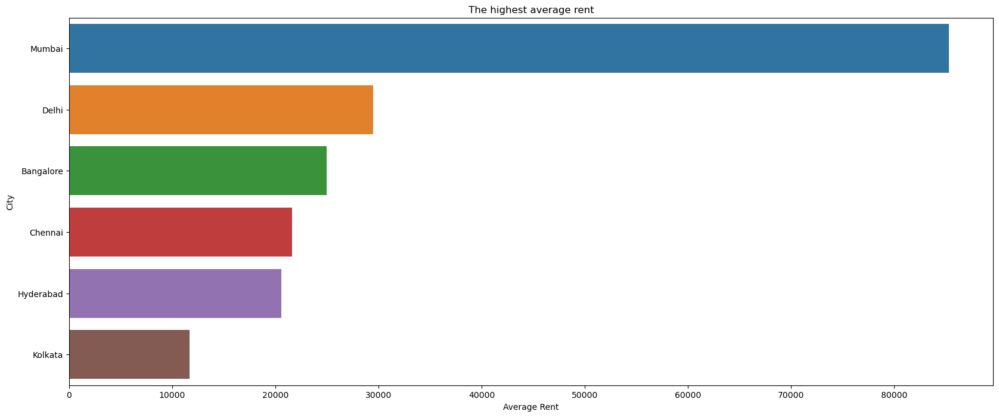

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

top_cities = city_rent_avg.sort_values(by='Rent', ascending=False).head(10)

plt.figure(figsize=(20, 8))
plt.title("The highest average rent")
sns.barplot(x=top_cities['Rent'], y=top_cities['City'], orient="h")
plt.xlabel("Average Rent")
plt.ylabel("City")
plt.show()


### Phân tích giá thuê trung bình dựa trên tình trạng "Furnishing Status" và "Area Type"

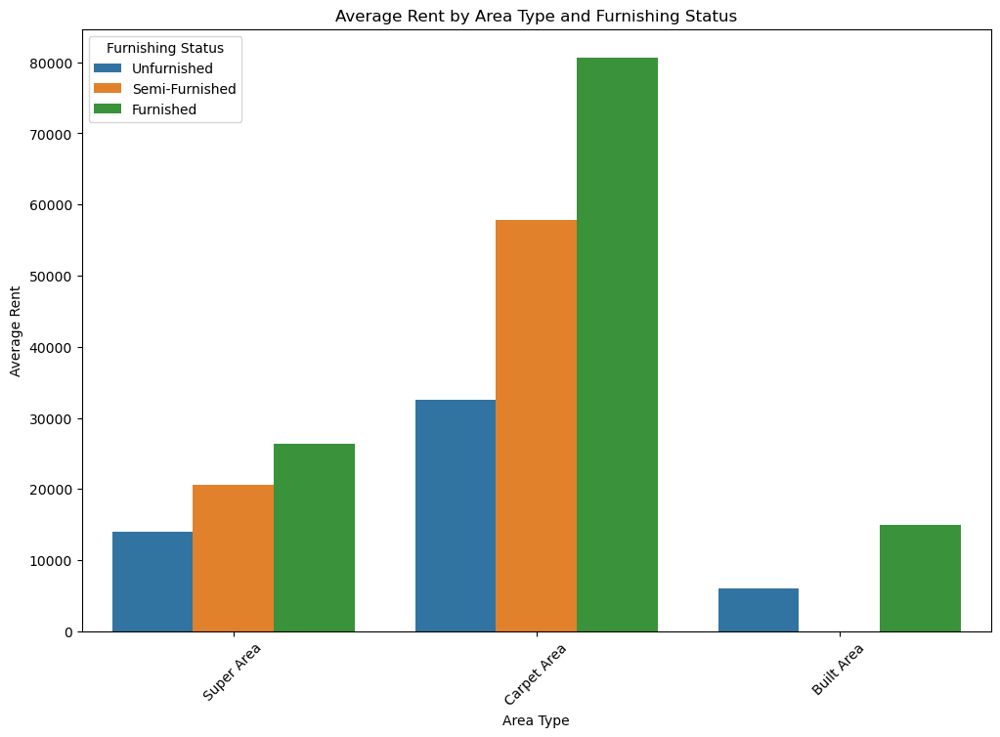

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.barplot(data=df, x='Area Type', y='Rent', hue='Furnishing Status', errorbar=None)
plt.title('Average Rent by Area Type and Furnishing Status')
plt.xlabel('Area Type')
plt.ylabel('Average Rent')
plt.xticks(rotation=45)
plt.show()


# 4.3. Ứng dụng mô hình thuật toán khai thác dữ liệu

Khai báo 6 từ điển (dictionary) trống, mỗi từ điển có tên là accuracy, precision, 
recall, f1, fpr và tpr.
- accuracy: Lưu trữ kết quả độ chính xác (accuracy) của mô hình trên từng 
lớp.
 precision: Lưu trữ kết quả độ chính xác dự báo (precision) của mô hình 
trên từng lớp.
- recall: Lưu trữ kết quả độ phủ sóng (recall) của mô hình trên từng lớp.
- f1: Lưu trữ kết quả độ F1 (F1-score) của mô hình trên từng lớp.
Mỗi từ điển sẽ được sử dụng để lưu kết quả đánh giá cho một lớp (class) trong 
bài toán phân loại đa lớp (multi-class classification). Các giá trị sẽ được cập nhật 
trong quá trình đánh giá mô hình.

In [13]:
accuracy = dict()
precision = dict()
recall = dict()
f1 = dict()


## 4.3.1. Tiền xử lý dữ liệu trước khi áp dụng các mô hình khai thác dữ liệu

### Lựa chọn các thuộc tính

In [14]:

# Tạo DataFrame mới chỉ chứa các thuộc tính cần thiết
X = df[['BHK', 'Rent', 'Size', 'Bathroom', 'is_basement', 'floor_number', 'building_floors']]

In [15]:
print("Các lớp duy nhất cho từng thuộc tính phân loại: ")
for cat in X:
    print("{:15s}".format(cat), "\t", len(X[cat].unique()))

Các lớp duy nhất cho từng thuộc tính phân loại: 
BHK             	 6
Rent            	 243
Size            	 615
Bathroom        	 8
is_basement     	 2
floor_number    	 53
building_floors 	 67


In [16]:
unique_values = df['BHK'].unique()
print("Unique values in 'column1':", unique_values)

Unique values in 'column1': [2 1 3 6 4 5]


### Xử lý các giá trị thiếu trong X

In [17]:
print(X.isna().sum())

BHK                0
Rent               0
Size               0
Bathroom           0
is_basement        0
floor_number       0
building_floors    4
dtype: int64


In [18]:
# Xác định giá trị phổ biến nhất trong cột 'building_floors'
mode_building_floors = X['building_floors'].mode()[0]

# Thay thế các giá trị thiếu bằng giá trị phổ biến nhất
X['building_floors'].fillna(mode_building_floors, inplace=True)


C:\Users\DELL\AppData\Local\Temp\ipykernel_8856\1156985349.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Chuẩn hóa

In [19]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

## 4.3.2. Chia dữ liệu trước khi xây dựng mô hình thuật toán

In [20]:
# Train/Validation - Test split
X, X_test = train_test_split(X, test_size=.2, random_state=42)
print(X.shape, X_test.shape)

(3796, 7) (950, 7)


Trước hết, gán DataFrame X vào một biến mới là sample.
- Trích xuất thuộc tính mục tiêu Rent từ sample và gán cho y_sample, 
còn lại các thuộc tính được gán cho X_sample.
- Sử dụng hàm train_test_split() để chia X_sample và y_sample thành tập 
huấn luyện và tập đánh giá. Thiết lập tham số random_state bằng 42 để
đảm bảo việc chia là có thể tái lập.
- Cuối cùng, in ra kích thước của hai tập kết quả sử dụng thuộc tính shape 
của mỗi DataFrame hoặc Series.

In [21]:
sample = X
y_sample = sample["BHK"]
X_sample = sample.drop("BHK", axis=1)

X_train, X_validate, y_train, y_validate = train_test_split(X_sample, y_sample, random_state=42)
print(X_train.shape, y_train.shape)
print(X_validate.shape, y_validate.shape)

(2847, 6) (2847,)
(949, 6) (949,)


In [22]:
X

,BHK,Rent,Size,Bathroom,is_basement,floor_number,building_floors
1995,2,23500,950,2,0,6,8.0
1497,2,10500,800,2,0,3,4.0
2763,1,19000,545,1,0,2,3.0
1351,1,20000,465,1,0,3,4.0
1862,2,17000,900,2,0,4,5.0
...,...,...,...,...,...,...,...
4426,3,25000,1500,3,0,1,2.0
466,3,20000,1200,2,0,3,3.0
3092,2,20000,800,2,0,13,17.0
3772,3,85000,3500,3,0,0,1.0


## 4.3.3. Decision Tree 

In [23]:
dtc = DecisionTreeClassifier(random_state=42)
parameters = [{"criterion": ["gini", "entropy"], "max_depth": [5, 10, 15, 30]}]
grid = GridSearchCV(dtc, parameters, verbose=5, n_jobs=-1)
grid.fit(X_train, y_train)

print("Best parameters scores:")
print(grid.best_params_)
print("Train score:", grid.score(X_train, y_train))
print("Validation score:", grid.score(X_validate, y_validate))

Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters scores:
{'criterion': 'gini', 'max_depth': 5}
Train score: 0.821917808219178
Validation score: 0.8229715489989463


In [24]:
print("Default scores:")
dtc.fit(X_train, y_train)
print("Train score:", dtc.score(X_train, y_train))
print("Validation score:", dtc.score(X_validate, y_validate))

Default scores:
Train score: 0.9859501229364243
Validation score: 0.743940990516333


In [25]:
pd.DataFrame(grid.cv_results_).sort_values(by="rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.008924,0.001373,0.003075,0.001829,gini,5,"{'criterion': 'gini', 'max_depth': 5}",0.807018,0.759649,0.818981,0.792619,0.813708,0.798395,0.021294,1
4,0.008698,0.001286,0.004376,0.000997,entropy,5,"{'criterion': 'entropy', 'max_depth': 5}",0.792982,0.757895,0.811951,0.775044,0.799649,0.787504,0.019011,2
1,0.012415,0.002231,0.004963,0.002377,gini,10,"{'criterion': 'gini', 'max_depth': 10}",0.773684,0.745614,0.801406,0.768014,0.780316,0.773807,0.018069,3
5,0.011744,0.001682,0.002727,0.000420,entropy,10,"{'criterion': 'entropy', 'max_depth': 10}",0.754386,0.733333,0.787346,0.766257,0.782074,0.764679,0.019531,4
7,0.014137,0.001637,0.004652,0.001636,entropy,30,"{'criterion': 'entropy', 'max_depth': 30}",0.715789,0.728070,0.750439,0.736380,0.722320,0.730600,0.012011,5
6,0.012333,0.001388,0.002402,0.001255,entropy,15,"{'criterion': 'entropy', 'max_depth': 15}",0.724561,0.712281,0.743409,0.748682,0.720562,0.729899,0.013866,6
2,0.012669,0.005354,0.002790,0.002321,gini,15,"{'criterion': 'gini', 'max_depth': 15}",0.726316,0.722807,0.739895,0.732865,0.727592,0.729895,0.005953,7
3,0.019495,0.007024,0.010297,0.013907,gini,30,"{'criterion': 'gini', 'max_depth': 30}",0.735088,0.710526,0.741652,0.715290,0.725835,0.725678,0.011672,8


In [27]:
y_pred = dtc.predict(X_validate)



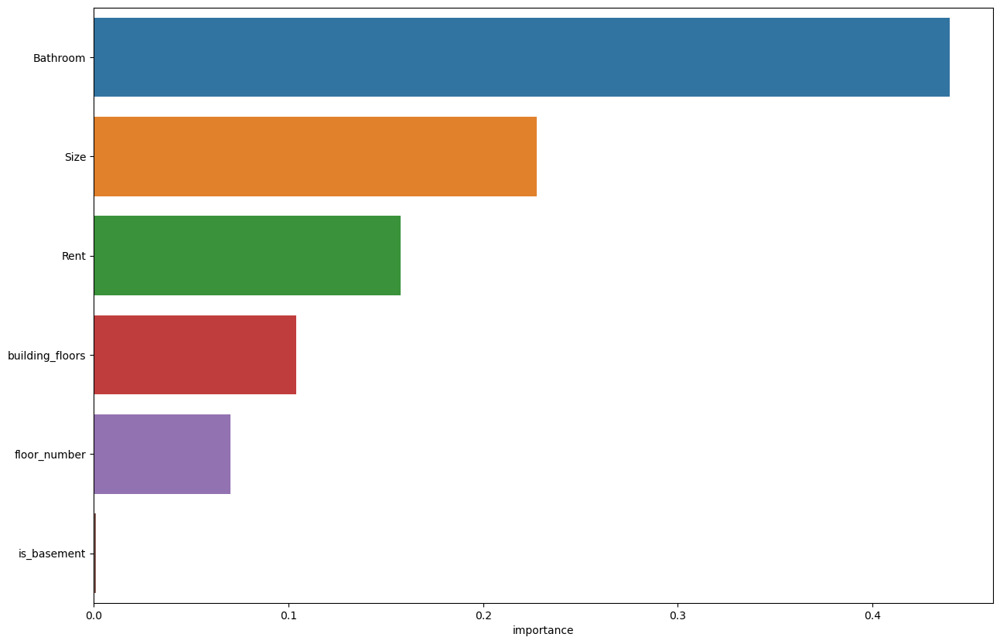

In [28]:
importances = pd.DataFrame(np.zeros((X_train.shape[1], 1)), columns=["importance"], index=X_train.columns)

importances.iloc[:,0] = dtc.feature_importances_

importances = importances.sort_values(by="importance", ascending=False)[:30]

plt.figure(figsize=(15, 10))
sns.barplot(x="importance", y=importances.index, data=importances)
plt.show()

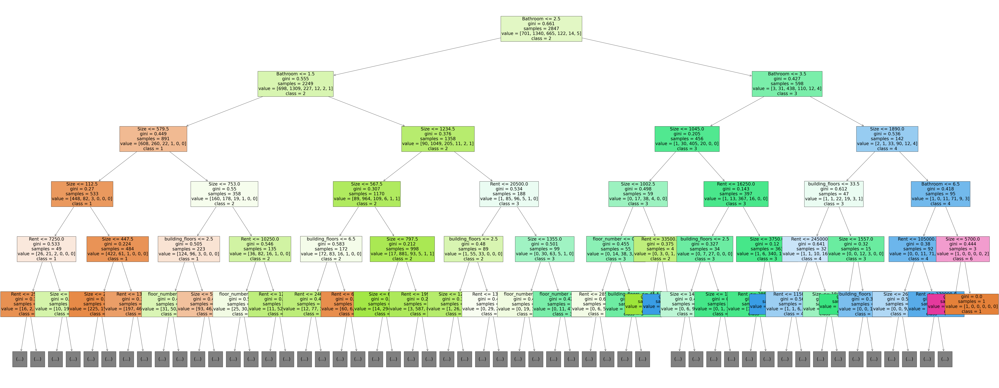

In [29]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import matplotlib.patches as mpatches


fig, ax = plt.subplots(figsize=(100, 40))
plot_tree(dtc, max_depth=5, fontsize=25, feature_names=X_train.columns.to_list(), class_names=[str(cls) for cls in dtc.classes_], filled=True)

plt.show()




# Đánh giá thuật toán

y_pred = dtc.predict(X_validate)

accuracy["Decision Tree"] = accuracy_score(y_validate, y_pred)
f1["Decision Tree"] = f1_score(y_validate, y_pred, average="macro")

print(classification_report(y_train, dtc.predict(X_train)))
print(classification_report(y_validate, y_pred))

In [30]:
print(classification_report(y_train, dtc.predict(X_train)))

              precision    recall  f1-score   support

           1       0.97      1.00      0.98       701
           2       0.99      0.98      0.99      1340
           3       1.00      0.98      0.99       665
           4       1.00      0.98      0.99       122
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00         5

    accuracy                           0.99      2847
   macro avg       0.99      0.99      0.99      2847
weighted avg       0.99      0.99      0.99      2847



In [31]:
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

           1       0.75      0.83      0.79       229
           2       0.79      0.73      0.76       460
           3       0.71      0.72      0.71       228
           4       0.41      0.56      0.47        25
           5       0.25      0.25      0.25         4
           6       0.00      0.00      0.00         3

    accuracy                           0.74       949
   macro avg       0.49      0.51      0.50       949
weighted avg       0.75      0.74      0.74       949



## Accuracy - Decision Tree

In [32]:
accuracy["Decision Tree"] = accuracy_score(y_validate, y_pred)
print("Accuracy - Decision Tree: ", accuracy["Decision Tree"])

Accuracy - Decision Tree:  0.743940990516333


### F1-Score - Recall - Precision - Decision Tree

In [33]:
f1["Decision Tree"] = f1_score(y_validate, y_pred, average="macro")
precisionScore = precision_score(y_validate, y_pred, average="macro")
recallScore = recall_score(y_validate, y_pred, average="macro")
print("f1-Score - Decision Tree: ", f1["Decision Tree"])
print("precision - Decision Tree: ", precisionScore)
print("recall - Decision Tree: ", recallScore)

f1-Score - Decision Tree:  0.4977437032138347
precision - Decision Tree:  0.4853480812755732
recall - Decision Tree:  0.514901394204453


## 4.3.4. Random Forest

In [34]:
rfc = RandomForestClassifier(n_jobs=-1, random_state=42)
parameters = [{"n_estimators": [50, 100, 200, 500], "max_depth": [5, 10, 15, 30]}]
grid = GridSearchCV(rfc, parameters, verbose=5, n_jobs=-1)
grid.fit(X_train, y_train)

print("Best parameters scores:")
print(grid.best_params_)
print("Train score:", grid.score(X_train, y_train))
print("Validation score:", grid.score(X_validate, y_validate))

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best parameters scores:
{'max_depth': 10, 'n_estimators': 200}
Train score: 0.898840885142255
Validation score: 0.827186512118019


In [35]:
print("Default scores:")
rfc.fit(X_train, y_train)
print("Train score:", rfc.score(X_train, y_train))
print("Validation score:", rfc.score(X_validate, y_validate))

Default scores:
Train score: 0.9859501229364243
Validation score: 0.8008429926238145


In [36]:
pd.DataFrame(grid.cv_results_).sort_values(by="rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
6,0.779701,0.064621,0.079450,0.006055,10,200,"{'max_depth': 10, 'n_estimators': 200}",0.812281,0.764912,0.829525,0.794376,0.829525,0.806124,0.024370,1
7,2.322713,0.265230,0.226985,0.041167,10,500,"{'max_depth': 10, 'n_estimators': 500}",0.815789,0.757895,0.833040,0.794376,0.827768,0.805774,0.027386,2
5,0.633127,0.123184,0.085940,0.043475,10,100,"{'max_depth': 10, 'n_estimators': 100}",0.810526,0.759649,0.833040,0.796134,0.820738,0.804018,0.025278,3
1,0.369269,0.001567,0.038847,0.004173,5,100,"{'max_depth': 5, 'n_estimators': 100}",0.805263,0.761404,0.831283,0.776801,0.838313,0.802613,0.029893,4
4,0.155102,0.012401,0.109582,0.154009,10,50,"{'max_depth': 10, 'n_estimators': 50}",0.815789,0.759649,0.826011,0.794376,0.817223,0.802610,0.023867,5
2,0.706277,0.053829,0.081919,0.014160,5,200,"{'max_depth': 5, 'n_estimators': 200}",0.805263,0.763158,0.829525,0.780316,0.833040,0.802261,0.027241,6
0,0.188128,0.034751,0.047980,0.013724,5,50,"{'max_depth': 5, 'n_estimators': 50}",0.814035,0.761404,0.826011,0.775044,0.833040,0.801907,0.028494,7
3,1.918403,0.098258,0.176370,0.030297,5,500,"{'max_depth': 5, 'n_estimators': 500}",0.803509,0.764912,0.827768,0.778559,0.827768,0.800503,0.025472,8
9,0.598546,0.117691,0.089653,0.033729,15,100,"{'max_depth': 15, 'n_estimators': 100}",0.800000,0.756140,0.831283,0.785589,0.820738,0.798750,0.026579,9
10,1.171012,0.116531,0.117870,0.040445,15,200,"{'max_depth': 15, 'n_estimators': 200}",0.805263,0.754386,0.826011,0.785589,0.820738,0.798397,0.026114,10


In [37]:
y_pred = rfc.predict(X_validate)




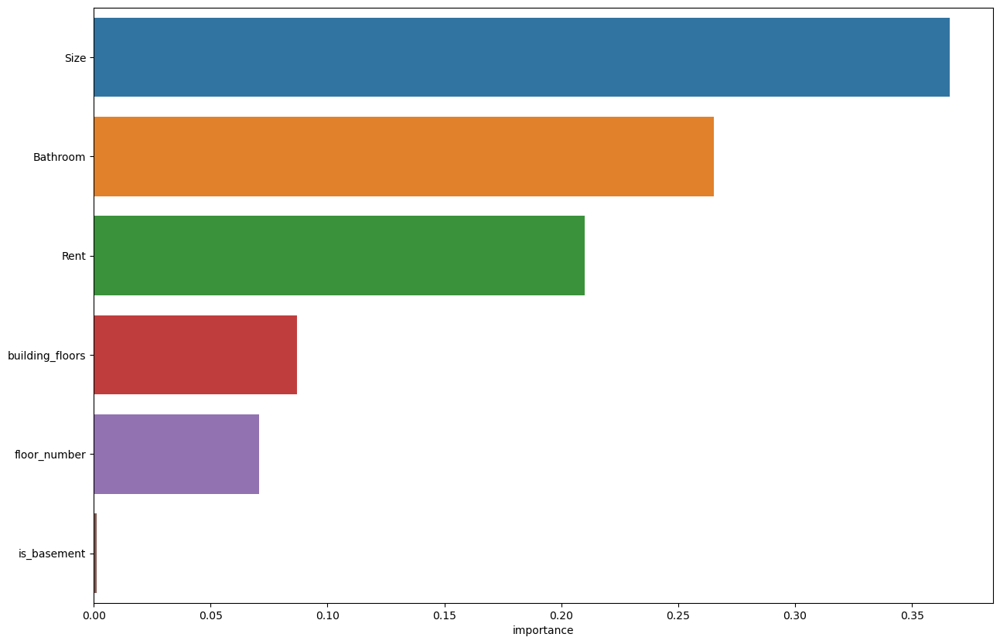

In [38]:
importances = pd.DataFrame(np.zeros((X_train.shape[1], 1)), columns=["importance"], index=X_train.columns)

importances.iloc[:,0] = rfc.feature_importances_

importances = importances.sort_values(by="importance", ascending=False)[:30]

plt.figure(figsize=(15, 10))
sns.barplot(x="importance", y=importances.index, data=importances)
plt.show()

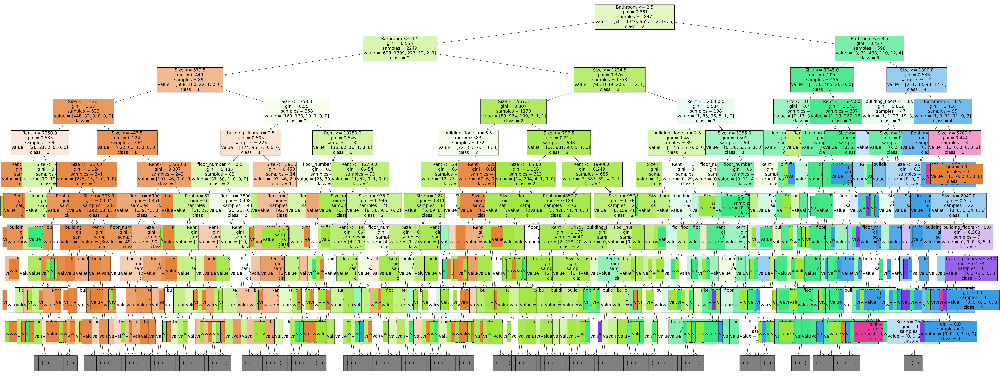

In [39]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import matplotlib.patches as mpatches


fig, ax = plt.subplots(figsize=(100, 40))
plot_tree(dtc, max_depth=10, fontsize=25, feature_names=X_train.columns.to_list(), class_names=[str(cls) for cls in dtc.classes_], filled=True)

plt.show()




# Đánh giá thuật toán

In [40]:
print(classification_report(y_train, rfc.predict(X_train)))

              precision    recall  f1-score   support

           1       0.97      0.99      0.98       701
           2       0.99      0.99      0.99      1340
           3       1.00      0.98      0.99       665
           4       1.00      0.98      0.99       122
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00         5

    accuracy                           0.99      2847
   macro avg       0.99      0.99      0.99      2847
weighted avg       0.99      0.99      0.99      2847



In [41]:
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

           1       0.79      0.85      0.82       229
           2       0.82      0.82      0.82       460
           3       0.81      0.75      0.78       228
           4       0.55      0.64      0.59        25
           5       0.00      0.00      0.00         4
           6       0.00      0.00      0.00         3

    accuracy                           0.80       949
   macro avg       0.49      0.51      0.50       949
weighted avg       0.80      0.80      0.80       949



C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### Accuracy - Random Forest

In [42]:
accuracy["Random Forest"] = accuracy_score(y_validate, y_pred)
print("accuracy - Random Forest: ", accuracy["Random Forest"])

accuracy - Random Forest:  0.8008429926238145


### F1-Score - Recall - Precision - Random Forest

In [43]:
f1["Random Forest"] = f1_score(y_validate, y_pred, average="macro")
precisionScore = precision_score(y_validate, y_pred, average="macro")
recallScore = recall_score(y_validate, y_pred, average="macro")
print("f1-Score - Random Forest: ", f1["Random Forest"])
print("precision - Random Forest: ", precisionScore)
print("recall - Random Forest: ", recallScore)

f1-Score - Random Forest:  0.501859993493743
precision - Random Forest:  0.4948757379826554
recall - Random Forest:  0.5105477778999109


C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## 4.3.5. Naive Bayes

## Built and predict - Gaussian Naive Bayes

In [44]:
from datetime import timedelta
import time
gnb_start_time = time.time()
gnb = GaussianNB()
gnb.fit(X_train, y_train)
gnb_end_time = time.time()
gnb_time = gnb_end_time - gnb_start_time
print("Train score:", gnb.score(X_train, y_train))
print("Validation score:", gnb.score(X_validate, y_validate))
print("Time is: ", timedelta(seconds=round(gnb_time,4)))


Train score: 0.6111696522655427
Validation score: 0.6322444678609063
Time is:  0:00:00.007200


In [45]:
y_pred = gnb.predict(X_validate)

## Algorithms Evaluation - Gaussian Naive Bayes

In [46]:
print(classification_report(y_train, gnb.predict(X_train)))

              precision    recall  f1-score   support

           1       0.57      0.82      0.67       701
           2       0.65      0.65      0.65      1340
           3       0.65      0.38      0.48       665
           4       0.46      0.32      0.38       122
           5       0.50      0.36      0.42        14
           6       0.14      0.60      0.23         5

    accuracy                           0.61      2847
   macro avg       0.50      0.52      0.47      2847
weighted avg       0.62      0.61      0.60      2847



In [47]:
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

           1       0.58      0.86      0.69       229
           2       0.67      0.67      0.67       460
           3       0.72      0.36      0.48       228
           4       0.38      0.40      0.39        25
           5       0.33      0.25      0.29         4
           6       0.33      0.67      0.44         3

    accuracy                           0.63       949
   macro avg       0.50      0.53      0.49       949
weighted avg       0.65      0.63      0.62       949



### Accuracy -  Gaussian Naive Bayes

In [48]:
accuracy["Gaussian Naive Bayes"] = accuracy_score(y_validate, y_pred)
print("Accuracy - Gaussian Naive Bayes: ", accuracy["Gaussian Naive Bayes"])

Accuracy - Gaussian Naive Bayes:  0.6322444678609063


### F1-Score - Recall - Precision - Gaussian Naive Bayes

In [49]:
f1["Gaussian Naive Bayes"] = f1_score(y_validate, y_pred, average="macro")
precisionScore = precision_score(y_validate, y_pred, average="macro")
recallScore = recall_score(y_validate, y_pred, average="macro")
print("f1-Score - Gaussian Naive Bayes: ", f1["Gaussian Naive Bayes"])
print("precision - Gaussian Naive Bayes: ", precisionScore)
print("recall - Gaussian Naive Bayes: ", recallScore)

f1-Score - Gaussian Naive Bayes:  0.4934940138304739
precision - Gaussian Naive Bayes:  0.5029670054561982
recall - Gaussian Naive Bayes:  0.5336230107577024


## 4.3.6. Bernoulli Naive Bayes

In [50]:
bnb_start_time = time.time()
bnb = BernoulliNB()
bnb.fit(X_train, y_train)
bnb_end_time = time.time()
bnb_time = bnb_end_time - bnb_start_time
print("Train score:", bnb.score(X_train, y_train))
print("Validation score:", bnb.score(X_validate, y_validate))
print("Time is: ", timedelta(seconds=round(bnb_time,4)))

Train score: 0.47067088162978576
Validation score: 0.48472075869336145
Time is:  0:00:00.020700


In [51]:
y_pred = bnb.predict(X_validate)

## Algorithm Evaluation - Bernoulli Naive Bayes

In [52]:
print(classification_report(y_train, bnb.predict(X_train)))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       701
           2       0.47      1.00      0.64      1340
           3       0.00      0.00      0.00       665
           4       0.00      0.00      0.00       122
           5       0.00      0.00      0.00        14
           6       0.00      0.00      0.00         5

    accuracy                           0.47      2847
   macro avg       0.08      0.17      0.11      2847
weighted avg       0.22      0.47      0.30      2847



C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [53]:
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       229
           2       0.48      1.00      0.65       460
           3       0.00      0.00      0.00       228
           4       0.00      0.00      0.00        25
           5       0.00      0.00      0.00         4
           6       0.00      0.00      0.00         3

    accuracy                           0.48       949
   macro avg       0.08      0.17      0.11       949
weighted avg       0.23      0.48      0.32       949



C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### Accuracy -  Bernoulli Naive Bayes

In [54]:
accuracy["Bernoulli Naive Bayes"] = accuracy_score(y_validate, y_pred)
print("Accuracy - Bernoulli Naive Bayes: ", accuracy["Bernoulli Naive Bayes"])

Accuracy - Bernoulli Naive Bayes:  0.48472075869336145


### F1-Score - Recall - Precision - Bernoulli Naive Bayes

In [55]:
f1["Bernoulli Naive Bayes"] = f1_score(y_validate, y_pred, average="macro")
precisionScore = precision_score(y_validate, y_pred, average="macro")
recallScore = recall_score(y_validate, y_pred, average="macro")
print("f1-Score - Bernoulli Naive Bayes: ", f1["Bernoulli Naive Bayes"])
print("precision - Bernoulli Naive Bayes: ", precisionScore)
print("recall - Bernoulli Naive Bayes: ", recallScore)

f1-Score - Bernoulli Naive Bayes:  0.10882422521883132
precision - Bernoulli Naive Bayes:  0.08078679311556024
recall - Bernoulli Naive Bayes:  0.16666666666666666


C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



# 4.4 Đánh giá thuật toán và dự báo

### Accuracy

C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



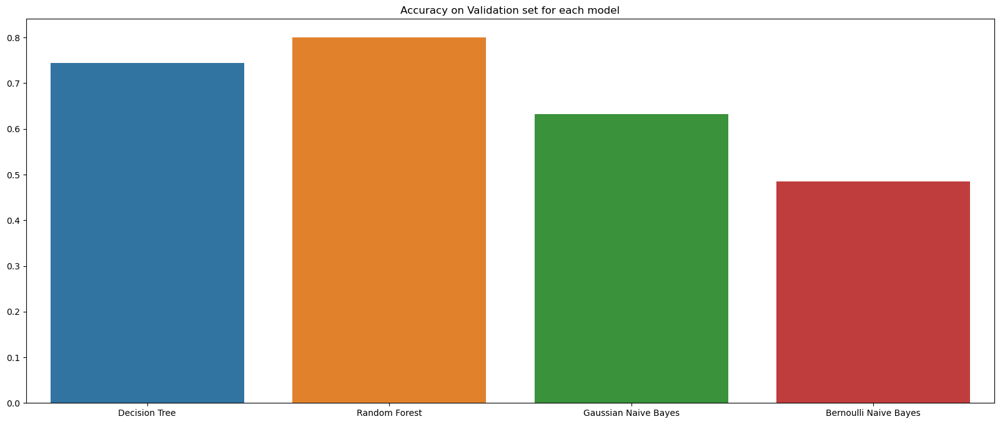

In [56]:
plt.figure(figsize=(20, 8))
plt.title("Accuracy on Validation set for each model")
sns.barplot(x = list(range(len(accuracy))), y = list(accuracy.values()))
plt.xticks(range(len(accuracy)), labels=accuracy.keys())
plt.show()

### F1 Score

C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



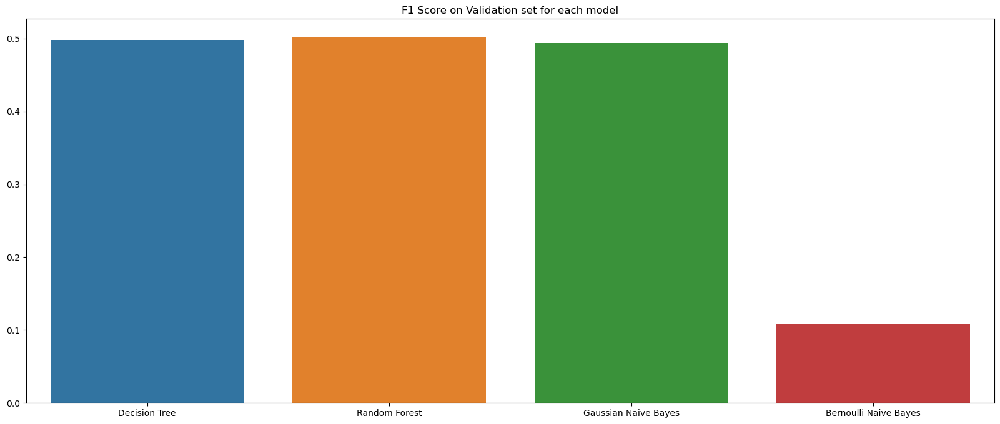

In [57]:
plt.figure(figsize=(20, 8))
plt.title("F1 Score on Validation set for each model")
sns.barplot(x =list(range(len(f1))), y =list(f1.values()))
plt.xticks(range(len(f1)), labels=f1.keys())
plt.show()

## Dự báo bằng Random Forest

In [58]:
sample = X_test
y_test_sample = sample["BHK"]
X_test_sample = sample.drop("BHK", axis=1)

y_pred = rfc.predict(X_test_sample)

print(classification_report(y_test_sample, y_pred))

              precision    recall  f1-score   support

           1       0.78      0.84      0.81       237
           2       0.82      0.79      0.80       465
           3       0.73      0.76      0.75       205
           4       0.79      0.64      0.71        42
           5       0.00      0.00      0.00         1

    accuracy                           0.79       950
   macro avg       0.63      0.61      0.61       950
weighted avg       0.79      0.79      0.79       950



C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



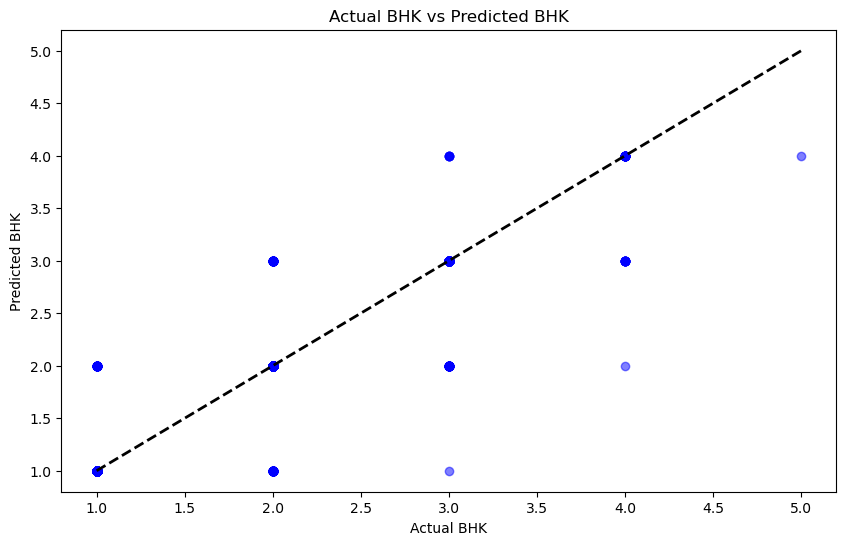

In [59]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test_sample, y_pred, color='blue', alpha=0.5)
plt.plot([y_test_sample.min(), y_test_sample.max()], [y_test_sample.min(), y_test_sample.max()], 'k--', lw=2)  # Đường thẳng cho so sánh
plt.xlabel('Actual BHK')
plt.ylabel('Predicted BHK')
plt.title('Actual BHK vs Predicted BHK')
plt.show()